In [1]:
# ! python segment/predict.py \
#     --imgsz 1600 \
#     --source $WORKDIR/users/2221/FishPonds/data/fishponds_split-1_yolov7/test/images \
#     --weights $WORKDIR/users/2221/FishPonds/YOLO/yolov7/seg/runs/train-seg/epochs1000/weights/best.pt \
#     --save-txt \
#     --save-conf \
#     --conf-thres 0.50 \
#     --name pred_testdataset

# This notebook:
* convert the predicted masks to points/a polygon
* Save the predictions as classes as TP, FN or FP in npz files
* Plot some polygons on top of images

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import glob
import os

import json
import pandas as pd
from shapely.geometry import box, Polygon
from shapely.validation import make_valid
from matplotlib import patches
from pylabel import importer
from shapely.validation import make_valid
import scipy
# import seaborn as sns
# sns.set_palette("colorblind", 9)
# mpl.style.use('seaborn-v0_8-colorblind')
# plt.rcParams.update({'font.size': 8})
%config InlineBackend.figure_format='retina'

In [2]:
def scale_masks(img1_shape, masks, img0_shape, ratio_pad=None):
    """
    img1_shape: model input shape, [h, w]
    img0_shape: origin pic shape, [h, w, 3]
    masks: [h, w, num]
    resize for the most time
    """
    # Rescale coords (xyxy) from img1_shape to img0_shape
    if ratio_pad is None:  # calculate from img0_shape
        gain = min(img1_shape[0] / img0_shape[0], img1_shape[1] / img0_shape[1])  # gain  = old / new
        pad = (img1_shape[1] - img0_shape[1] * gain) / 2, (img1_shape[0] - img0_shape[0] * gain) / 2  # wh padding
    else:
        gain = ratio_pad[0][0]
        pad = ratio_pad[1]
    tl_pad = int(pad[1]), int(pad[0])  # y, x
    br_pad = int(img1_shape[0] - pad[1]), int(img1_shape[1] - pad[0])

    if len(masks.shape) < 2:
        raise ValueError(f'"len of masks shape" should be 2 or 3, but got {len(masks.shape)}')
    # masks_h, masks_w, n
    masks = masks[tl_pad[0]:br_pad[0], tl_pad[1]:br_pad[1]]
    # 1, n, masks_h, masks_w
    # masks = masks.permute(2, 0, 1).contiguous()[None, :]
    # # shape = [1, n, masks_h, masks_w] after F.interpolate, so take first element
    # masks = F.interpolate(masks, img0_shape[:2], mode='bilinear', align_corners=False)[0]
    # masks = masks.permute(1, 2, 0).contiguous()
    # masks_h, masks_w, n
    masks = cv2.resize(masks, (img0_shape[1], img0_shape[0]))

    # keepdim
    if len(masks.shape) == 2:
        masks = masks[:, :, None]

    return masks

def mask_to_polygons(mask: np.ndarray):
    """
    Converts a binary mask to a list of polygons.

    Parameters:
        mask (np.ndarray): A binary mask represented as a 2D NumPy array of
            shape `(H, W)`, where H and W are the height and width of
            the mask, respectively.

    Returns:
        List[np.ndarray]: A list of polygons, where each polygon is represented by a
            NumPy array of shape `(N, 2)`, containing the `x`, `y` coordinates
            of the points. Polygons with fewer points than `MIN_POLYGON_POINT_COUNT = 3`
            are excluded from the output.
    """

    contours, _ = cv2.findContours(
        mask.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE
    )
    return [
        np.squeeze(contour, axis=1)
        for contour in contours
        if contour.shape[0] >= 5
    ]

In [3]:
def create_iou_matrix(n_true, n_pred, p_true, p_pred, idx_validation, iou_validation):
    iou_matrix = np.zeros((n_true, n_pred))
    for i in range(n_true):
        for j in range(n_pred):
            polygon_true = make_valid(Polygon(p_true[i]))
            polygon_pred = make_valid(Polygon(p_pred[j]))
            # print(i, j)
            polygon_intersection = polygon_true.intersection(polygon_pred).area
            polygon_union = polygon_true.union(polygon_pred).area
            iou_matrix[i, j] = polygon_intersection / polygon_union 
    idxs_true, idxs_pred = scipy.optimize.linear_sum_assignment(1 - iou_matrix)
    idx_validation.append([idxs_true, idxs_pred])
    iou_validation.append(iou_matrix)
    # ious_actual = iou_matrix[idxs_true, idxs_pred]
    return idx_validation, iou_validation

In [4]:
!pwd

/lustre/davis/users/2221/FishPonds/YOLO/yolov7/seg


# Extract Masks output from the model prediction

In [24]:
# predictions from model
# MODEL_NAME = "from_zero_ogun_delta_combine_background_v3_v0"
# MODEL_NAME = "from_zero_final_dataset_freeze_v023_valid"

# MODEL_NAME = "fine_tune_final_dataset_freeze_v02_3_valid"

MODEL_NAME = "from_zero_final_dataset_freeze_v02_3_valid"
# MODEL_NAME = "from_zero_ogun_delta_combine_background_v3_v0_valid"


path_folder = f"true_all_{MODEL_NAME}"
path_to_masks_ogun = glob.glob(f"runs/predict-seg/{path_folder}/labels/mask_*")
path_to_pred = glob.glob(f"runs/predict-seg/{path_folder}/labels/*.txt")
path_to_imgs = glob.glob(f"runs/predict-seg/{path_folder}/*.jpg")



In [25]:
path_to_masks_ogun.sort()
path_to_pred.sort()
path_to_imgs.sort()

In [26]:
path_to_masks_ogun

['runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/labels/mask_Abia_g3c10r0_png.rf.f96d2ae54d7bea13c184faf75b31a0a6.npy',
 'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/labels/mask_Abia_g4c7r29_png.rf.b85be02ea3e796790557e9b104ed49c4.npy',
 'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/labels/mask_Bayelsa_g259c24r13_png.rf.be9c1c4c159e4cf1a4f5d1ed3cb0ae36.npy',
 'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/labels/mask_Ebonyi_g135c10r16_png.rf.489c1de85f3a1fcd0ef29209dd52e1a3.npy',
 'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/labels/mask_Edo_g198c11r11_png.rf.908314950c0c7a0a323954ab6812f734.npy',
 'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/labels/mask_Ekiti_g195c21r1_png.rf.e499b0955768c2d4c74d65a36de4ec6d.npy',
 'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/labels/mask_Ekiti_g70c17r13_png.rf.9dd6dcbd5cf6298c7f3ea0ab37

In [27]:
len(path_to_masks_ogun)

26

In [28]:
path_to_imgs, len(path_to_imgs)

(['runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Abia_g3c10r0_png.rf.f96d2ae54d7bea13c184faf75b31a0a6.jpg',
  'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Abia_g4c7r29_png.rf.b85be02ea3e796790557e9b104ed49c4.jpg',
  'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Bayelsa_g259c24r13_png.rf.be9c1c4c159e4cf1a4f5d1ed3cb0ae36.jpg',
  'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Ebonyi_g135c10r16_png.rf.489c1de85f3a1fcd0ef29209dd52e1a3.jpg',
  'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Edo_g198c11r11_png.rf.908314950c0c7a0a323954ab6812f734.jpg',
  'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Ekiti_g195c21r1_png.rf.e499b0955768c2d4c74d65a36de4ec6d.jpg',
  'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Ekiti_g70c17r13_png.rf.9dd6dcbd5cf6298c7f3ea0ab3722b407.jpg',
  'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_

In [29]:
path_to_imgs = [x for x in path_to_imgs if 'y' not in x.split('/')[-1]]
path_to_imgs = [x for x in path_to_imgs if 'delta' not in x.split('/')[-1]]
path_to_imgs

['runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Abia_g3c10r0_png.rf.f96d2ae54d7bea13c184faf75b31a0a6.jpg',
 'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Abia_g4c7r29_png.rf.b85be02ea3e796790557e9b104ed49c4.jpg',
 'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Edo_g198c11r11_png.rf.908314950c0c7a0a323954ab6812f734.jpg',
 'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Ekiti_g195c21r1_png.rf.e499b0955768c2d4c74d65a36de4ec6d.jpg',
 'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Ekiti_g70c17r13_png.rf.9dd6dcbd5cf6298c7f3ea0ab3722b407.jpg',
 'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Ekiti_g95c25r23_png.rf.019601f7e75f967506e5f2d87a014df5.jpg',
 'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Imo_g64c3r14_png.rf.28344dd716cec8858b081c7cf93d32f9.jpg',
 'runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/Kaduna_g

# Define paths to coco annotations

In [30]:
names_folders_annotations = ['Bhoktear_states-5', 'John_states-3', 'Kwara-annotations-2', 'Rodiat_states-1', 
        'Tatiana_states-1', 'census_states-1']

In [31]:
df_annon_train = pd.DataFrame()
path_to_train_images = []
path_to_train = []
for nnfa in names_folders_annotations:
    print(nnfa)
    path_to_train_s = f"/lustre/davis/users/2221/FishPonds/data/{nnfa}/train/"
    path_to_train_images_s = glob.glob(f"/lustre/davis/users/2221/FishPonds/data/{nnfa}/train/*.jpg")

    train_annotations = glob.glob(f"/lustre/davis/users/2221/FishPonds/data/{nnfa}/train/*.json")
    dataset_train = importer.ImportCoco(train_annotations[0], path_to_images=path_to_train_s, name="BCCD_coco")
    df_annon_train_s = dataset_train.df[['img_folder', 'img_filename','img_width',
           'img_height','ann_bbox_xmin',
           'ann_bbox_ymin', 'ann_bbox_xmax', 'ann_bbox_ymax', 'ann_area', 'ann_segmentation' ]]
    print(df_annon_train_s.shape)
    df_annon_train = pd.concat([df_annon_train, df_annon_train_s])
    path_to_train_images.extend(path_to_train_images_s)
    path_to_train.append(path_to_train_s)
    

Bhoktear_states-5
(274, 10)
John_states-3
(618, 10)
Kwara-annotations-2
(948, 10)
Rodiat_states-1
(522, 10)
Tatiana_states-1
(179, 10)
census_states-1
(1853, 10)


/lustre/davis/sw/FishPonds/conda_qgis_2025/20250124/lib/python3.11/site-packages/pylabel/importer.py:127: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.fillna("", inplace=True)
/lustre/davis/sw/FishPonds/conda_qgis_2025/20250124/lib/python3.11/site-packages/pylabel/importer.py:127: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.fillna("", inplace=True)
/lustre/davis/sw/FishPonds/conda_qgis_2025/20250124/lib/python3.11/site-packages/pylabel/importer.py:127: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '' has dtype incompatible with float64, please explici

# Read annotations and predictions, convert mask to polygons, create the IoU 

    * IoU > 0.5 -> True Positive
    

In [32]:
path_to_train

['/lustre/davis/users/2221/FishPonds/data/Bhoktear_states-5/train/',
 '/lustre/davis/users/2221/FishPonds/data/John_states-3/train/',
 '/lustre/davis/users/2221/FishPonds/data/Kwara-annotations-2/train/',
 '/lustre/davis/users/2221/FishPonds/data/Rodiat_states-1/train/',
 '/lustre/davis/users/2221/FishPonds/data/Tatiana_states-1/train/',
 '/lustre/davis/users/2221/FishPonds/data/census_states-1/train/']

In [33]:
iou_testing = []
idx_testing = []
all_area_pred = []
all_area_true = []
all_length_pred = []
all_length_true = []
TP_all_area_pred = []
TP_all_area_true = []
TP_all_length_pred = []
TP_all_length_true = []
TP_points = []

FP_all_area_pred = []
FP_all_length_pred = []
FP_points = []


FN_all_area_true = []
FN_all_length_true = []
FN_points = []


total_pred = 0
total_true = 0
total_masks = 0
img = cv2.imread(path_to_train_images[0])

#loop over the images to extract the name of the img
for il in range(len(path_to_imgs)):
    TP_by_points = []
    FP_by_points = []
    FN_by_points = []
    
    file_img_name_short = '.'.join(path_to_imgs[il].split('/')[-1].split('.')[:-1])
    file_img_name = path_to_imgs[il].split('/')[-1]
    
    
    print(file_img_name)
    # find the split of the image, train, test or valid
    for ptt in path_to_train:
        if len(glob.glob(os.path.join(ptt, file_img_name))) == 1:
            long_file_name = glob.glob(os.path.join(ptt, file_img_name))[0].split('/')[-1]
            test_0_df = df_annon_train[df_annon_train['img_filename'] == long_file_name]
            print("train")
        else:
            continue
    # elif len(glob.glob(os.path.join(path_to_test, file_img_name))) == 1:
    #     long_file_name = glob.glob(os.path.join(path_to_test, file_img_name))[0].split('/')[-1]
    #     test_0_df = df_annon_test[df_annon_test['img_filename'] == long_file_name]
    #     print("test")
        
    # elif len(glob.glob(os.path.join(path_to_valid, file_img_name))) == 1:
    #     long_file_name = glob.glob(os.path.join(path_to_valid, file_img_name))[0].split('/')[-1]
    #     test_0_df = df_annon_valid[df_annon_valid['img_filename'] == long_file_name]
    #     print("valid")
    else:
        print("no annotations, check img name")
        # break
        
    # save true annotations
    p_true = []
    if len(test_0_df) >= 1:
        for i in range(len(test_0_df)):
            seg = test_0_df.iloc[i]['ann_segmentation'][0]
            poly_test = [(seg[j], seg[j+1]) for j in range(0, len(seg), 2)]
            if len(poly_test) < 4:
                print(f"poly has {len(poly_test)} elements {poly_test}")
            p_true.append(poly_test)
            ppolygon_area = Polygon(poly_test).area
            ppolygon_length = Polygon(poly_test).length
            all_area_true.append(ppolygon_area)
            all_length_true.append(ppolygon_length)
    # if no true annotation create zero polygon
    else:
        p_true = ['nada']
    print(len(p_true))
    p_pred = []
    # find the mask of the image, the mask is the prediction, not all images have a mask
    file_to_mask = [x for x in path_to_masks_ogun if file_img_name_short in x] 
    print(file_img_name_short, file_to_mask)
    # if mask exist
    if len(file_to_mask) == 1:
        file_to_mask = file_to_mask[0]
        print(file_to_mask)
        if os.path.isfile(file_to_mask):
            mask_test = np.load(file_to_mask)
            print("size mask")
            print(mask_test.shape)
            total_masks = mask_test.shape[0]+total_masks
            masks_true_size = np.zeros((len(mask_test), img.shape[0], img.shape[1], 1))
            mask_to_polygons_list = []
            # scale mask to image size (2000x2000), the model predicts masks of size (1600x1600)
            # convert mask to polyogn
            for id in range(len(mask_test)):
                masks_true_size[id] = scale_masks((mask_test.shape[1],mask_test.shape[-1]), np.uint8(mask_test[id]), (img.shape[0], img.shape[1], 3))
                mask_to_polygon = mask_to_polygons(masks_true_size[id])
                if len(mask_to_polygon) > 1:
                    sizes_len = []
                    for ixs in range(len(mask_to_polygon)):
                        sizes_len.append(len(mask_to_polygon[ixs]))
                    mask_to_polygons_list.append(mask_to_polygon[np.argmax(np.array(sizes_len))])
                else:
                    mask_to_polygons_list.append(mask_to_polygon[0])
            
            for i in range(mask_test.shape[0]):
                points = [[mask_to_polygons_list[i][ixs, 0].item(), mask_to_polygons_list[i][ixs, 1].item()] for ixs in range(len(mask_to_polygons_list[i]))] 
                p_pred.append(points)
                ppolygon_area = Polygon(points).area
                ppolygon_length = Polygon(points).length
                all_area_pred.append(ppolygon_area)
                all_length_pred.append(ppolygon_length)
        else:
            print("mask file no exist")
        n_true = len(p_true)
        n_pred = len(p_pred)
        print("n true, n pred")
        print(n_true, n_pred)
        total_pred = n_pred + total_pred
        total_true = n_true + total_true
        
        MAX_DIST = 1.0
        MIN_IOU = 0.0

        # only one true annotation
        if n_true == 1:
            # if the area is 0, is the p_true = [[(0,0),(0,0),(0,0),(0,0)]] from above, all pred are FP
            if if p_true[0] == 'nada':
                iou_testing.append(np.array([n_pred]))
                idx_testing.append(n_pred)
            else:
                # real one single annotations, but no predictions
                if n_pred == 0:
                    iou_testing.append(np.expand_dims(np.array([[n_true], [n_true], [n_true]]), axis=-1))
                    idx_testing.append(n_true)
                else:
                    idx_testing, iou_testing = create_iou_matrix(n_true, n_pred, p_true, p_pred, idx_testing, iou_testing)
        else:
            if n_pred == 0:
                iou_testing.append(np.expand_dims(np.array([[n_true], [n_true], [n_true]]), axis=-1))
                idx_testing.append(n_true)
            else:
                # NUM_GT x NUM_PRED: create iou matrix
                idx_testing, iou_testing = create_iou_matrix(n_true, n_pred, p_true, p_pred, idx_testing, iou_testing)
    
        # save True Positives
        TP_pred_indices = []
        TP_true_indices = []
        # true annotations and more than one
        if len(iou_testing[-1].shape) == 2: 
            TP_indices = np.argwhere(iou_testing[-1][idx_testing[-1][0], idx_testing[-1][1]] > 0.50).flatten()
            # if there is iou match
            if len(TP_indices) > 0:
                for pi_pred in TP_indices:
                    TP_selected_points = p_pred[idx_testing[-1][1][pi_pred]]
                    TP_pred_indices.append(idx_testing[-1][1][pi_pred])
                    TP_by_points.append(TP_selected_points)
                    ppolygon_area = Polygon(TP_selected_points).area
                    ppolygon_length = Polygon(TP_selected_points).length
                    TP_all_area_pred.append(ppolygon_area)
                    TP_all_length_pred.append(ppolygon_length)
    
                    TP_selected_points = p_true[idx_testing[-1][0][pi_pred]]
                    TP_true_indices.append(idx_testing[-1][0][pi_pred])
                    ppolygon_area = Polygon(TP_selected_points).area
                    ppolygon_length = Polygon(TP_selected_points).length
                    TP_all_area_true.append(ppolygon_area)
                    TP_all_length_true.append(ppolygon_length)
    
                mask = np.full(n_pred,True,dtype=bool)
                mask[np.array(TP_pred_indices)] = False
                
                # Save False Positives
                FP_pred_indices = np.arange(n_pred)[mask]
                for fpi_pred in FP_pred_indices:
                    FP_selected_points = p_pred[fpi_pred]
                    FP_by_points.append(FP_selected_points)
                    ppolygon_area = Polygon(FP_selected_points).area
                    ppolygon_length = Polygon(FP_selected_points).length
                    FP_all_area_pred.append(ppolygon_area)
                    FP_all_length_pred.append(ppolygon_length)
    
    
                mask = np.full(n_true,True,dtype=bool)
                mask[np.array(TP_true_indices)] = False
                
                # Save False Negatives
                FN_true_indices = np.arange(n_true)[mask]
                for fni_true in FN_true_indices:
                    FN_selected_points = p_true[fni_true]
                    FN_by_points.append(FN_selected_points)
    
                    ppolygon_area = Polygon(FN_selected_points).area
                    ppolygon_length = Polygon(FN_selected_points).length
                    FN_all_area_true.append(ppolygon_area)
                    FN_all_length_true.append(ppolygon_length)
                    
            # no iou match, then False Positives and False Negatives
            else:
                for fpi_pred in range(n_pred):
                    FP_selected_points = p_pred[fpi_pred]
                    # FP_pred_indices.append(idx_testing[-1][pi_pred][-1])
                    FP_by_points.append(FP_selected_points)
                    ppolygon_area = Polygon(FP_selected_points).area
                    ppolygon_length = Polygon(FP_selected_points).length
                    FP_all_area_pred.append(ppolygon_area)
                    FP_all_length_pred.append(ppolygon_length)
                for fni_true in range(n_true):
                    FN_selected_points = p_true[fni_true]
                    FN_by_points.append(FN_selected_points)
                    ppolygon_area = Polygon(FN_selected_points).area
                    ppolygon_length = Polygon(FN_selected_points).length
                    FN_all_area_true.append(ppolygon_area)
                    FN_all_length_true.append(ppolygon_length)
    
        # no true annotations
        elif len(iou_testing[-1].shape) == 1: 
            for fpi_pred in range(n_pred):
                FP_selected_points = p_pred[fpi_pred]
                # FP_pred_indices.append(idx_testing[-1][pi_pred][-1])
                FP_by_points.append(FP_selected_points)
                ppolygon_area = Polygon(FP_selected_points).area
                ppolygon_length = Polygon(FP_selected_points).length
                FP_all_area_pred.append(ppolygon_area)
                FP_all_length_pred.append(ppolygon_length)
        # no predictions
        else:
            for fni_true in range(n_true):
                FN_selected_points = p_true[fni_true]
                FN_by_points.append(FN_selected_points)
                ppolygon_area = Polygon(FN_selected_points).area
                ppolygon_length = Polygon(FN_selected_points).length
                FN_all_area_true.append(ppolygon_area)
                FN_all_length_true.append(ppolygon_length)
        TP_points.append(TP_by_points)
        FP_points.append(FP_by_points)
        FN_points.append(FN_by_points)
    else:
        # if there is no mask, 1. no true annotation, no predictions, 2. no preidicitions
        print('no mask, no pred')
        TP_points.append([])
        FP_points.append([])
        if len(p_true) == 1 :
            # if the area is 0, is the p_true = [[(0,0),(0,0),(0,0),(0,0)]] from above
            if if p_true[0] == 'nada':
                print('no pred no true annotation, empty image')
                FN_points.append([])
                continue
            else:
                # area of p_true is > 0 then this is a FN
                iou_testing.append(np.expand_dims(np.array([[len(p_true)], [len(p_true)], [len(p_true)]]), axis=-1))
                idx_testing.append(len(p_true))
        else:
            iou_testing.append(np.expand_dims(np.array([[len(p_true)], [len(p_true)], [len(p_true)]]), axis=-1))
            idx_testing.append(len(p_true))

        for fni_true in range(len(p_true)):
            FN_selected_points = p_true[fni_true]
            FN_by_points.append(FN_selected_points)
            ppolygon_area = Polygon(FN_selected_points).area
            ppolygon_length = Polygon(FN_selected_points).length
            FN_all_area_true.append(ppolygon_area)
            FN_all_length_true.append(ppolygon_length)
        FN_points.append(FN_by_points)

Abia_g3c10r0_png.rf.f96d2ae54d7bea13c184faf75b31a0a6.jpg
train
no annotations, check img name
4
Abia_g3c10r0_png.rf.f96d2ae54d7bea13c184faf75b31a0a6 ['runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/labels/mask_Abia_g3c10r0_png.rf.f96d2ae54d7bea13c184faf75b31a0a6.npy']
runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/labels/mask_Abia_g3c10r0_png.rf.f96d2ae54d7bea13c184faf75b31a0a6.npy
size mask
(5, 1600, 1600)
n true, n pred
4 5
Abia_g4c7r29_png.rf.b85be02ea3e796790557e9b104ed49c4.jpg
train
no annotations, check img name
2
Abia_g4c7r29_png.rf.b85be02ea3e796790557e9b104ed49c4 ['runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/labels/mask_Abia_g4c7r29_png.rf.b85be02ea3e796790557e9b104ed49c4.npy']
runs/predict-seg/true_all_from_zero_final_dataset_freeze_v02_3_valid/labels/mask_Abia_g4c7r29_png.rf.b85be02ea3e796790557e9b104ed49c4.npy
size mask
(3, 1600, 1600)
n true, n pred
2 3
Edo_g198c11r11_png.rf.908314950c0c7a0a323954ab6812f7

In [34]:
total_pred, total_masks, total_true

(306, 306, 301)

In [35]:
len(all_area_pred), len(all_area_true), len(all_length_pred), len(all_length_true)

(306, 303, 306, 303)

In [36]:
len(TP_all_area_pred), len(TP_all_area_true), len(TP_all_length_pred), len(TP_all_length_true)

(233, 233, 233, 233)

In [37]:
len(FN_all_area_true), len(FN_all_length_true),

(70, 70)

In [38]:
len(FP_all_area_pred), len(FP_all_length_pred),

(73, 73)

In [39]:
len(TP_points), len(FP_points), len(FN_points)

(23, 23, 23)

In [40]:
FN_points[-2]

[]

# Plot the True annotations, TP, FP, FN polyons
    Save at the end as npz files

In [22]:
# fig, ax = plt.subplots(1,1, figsize=(10,10))

# for il in range(1):#len(path_to_test_images)):
#     FNs_poly = []
#     TPs_poly = []
#     FPs_poly = []
#     # file_img_name = path_to_test_images[il]

#     # file_img_name = '_'.join(path_to_masks_ogun[il].split('/')[-1].split('_')[1:]).replace('.npy', '.jpg')
#     file_img_name_short = path_to_imgs[il].split('/')[-1].split('.')[0]
#     file_img_name= path_to_imgs[il].split('/')[-1]
    
#     # print(file_img_name)
#     if len(glob.glob(os.path.join(path_to_train, file_img_name))) == 1:
#         long_file_name = glob.glob(os.path.join(path_to_train, file_img_name))[0].split('/')[-1]
#         img = cv2.imread(os.path.join(path_to_train, long_file_name))
#         test_0_df = df_annon_train[df_annon_train['img_filename'] == long_file_name]
#         # print("train")
#     elif len(glob.glob(os.path.join(path_to_test, file_img_name))) == 1:
#         long_file_name = glob.glob(os.path.join(path_to_test, file_img_name))[0].split('/')[-1]
#         img = cv2.imread(os.path.join(path_to_test, long_file_name))
#         test_0_df = df_annon_test[df_annon_test['img_filename'] == long_file_name]
#         # print("test")
#     elif len(glob.glob(os.path.join(path_to_valid, file_img_name))) == 1:
#         long_file_name = glob.glob(os.path.join(path_to_valid, file_img_name))[0].split('/')[-1]
#         img = cv2.imread(os.path.join(path_to_valid, long_file_name))
#         test_0_df = df_annon_valid[df_annon_valid['img_filename'] == long_file_name]
#         # print("valid")

    
#     # file_img_name = '_'.join(path_to_masks_ogun[il].split('/')[-1].split('_')[1:]).replace('.npy', '.jpg')

    
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     ax.imshow(img)
#     # ax[il].set_title(file_img_name.split("/")[-1].split(".")[0])

#     # plot true labels
#     if len(test_0_df) > 1:
#         # p_true = []
#         for i in range(len(test_0_df)):
#             seg = test_0_df.iloc[i]['ann_segmentation'][0]
#             poly_test = [(seg[j], seg[j+1]) for j in range(0, len(seg), 2)]
#             # p_true.append(poly_test)
#             polygon_test = patches.Polygon(poly_test, closed=True, edgecolor='red', linewidth=2, fill=False)
#             ax.add_patch(polygon_test)
            
#         polygon_test = patches.Polygon(poly_test, closed=True, edgecolor='red', linewidth=2, fill=False)
#         ax.add_patch(polygon_test)
# ax.set_xticks([])   
# ax.set_yticks([])
# plt.tight_layout()
# plt.savefig("ogun_example_diagram_paper.png", dpi=500 )

IndexError: index 20 is out of bounds for axis 0 with size 20

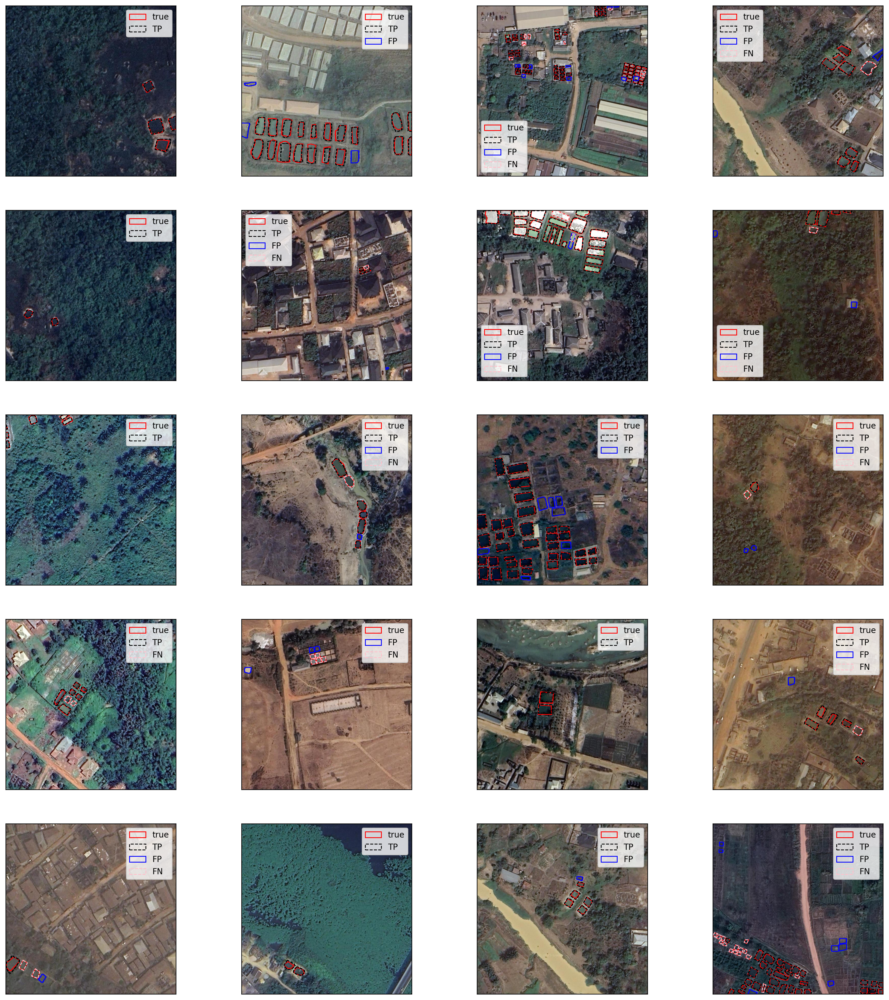

In [23]:
fig, ax = plt.subplots(5, 4, figsize=(20,22))
ax = ax.ravel(order='F')

for il in range(len(path_to_imgs)):#len(path_to_test_images)):
    FNs_poly = []
    TPs_poly = []
    FPs_poly = []
    # file_img_name = path_to_test_images[il]

    # file_img_name = '_'.join(path_to_masks_ogun[il].split('/')[-1].split('_')[1:]).replace('.npy', '.jpg')
    file_img_name_short = path_to_imgs[il].split('/')[-1].split('.')[0]
    file_img_name= path_to_imgs[il].split('/')[-1]
    
    # print(file_img_name)
    for ptt in path_to_train:
        if len(glob.glob(os.path.join(ptt, file_img_name))) == 1:
            long_file_name = glob.glob(os.path.join(ptt, file_img_name))[0].split('/')[-1]
            img = cv2.imread(os.path.join(ptt, long_file_name))
            test_0_df = df_annon_train[df_annon_train['img_filename'] == long_file_name]
            # print("train")

    
    # file_img_name = '_'.join(path_to_masks_ogun[il].split('/')[-1].split('_')[1:]).replace('.npy', '.jpg')

    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax[il].imshow(img)
    # ax[il].set_title(file_img_name.split("/")[-1].split(".")[0])

    # plot true labels
    if len(test_0_df) > 1:
        # p_true = []
        for i in range(len(test_0_df)):
            seg = test_0_df.iloc[i]['ann_segmentation'][0]
            poly_test = [(seg[j], seg[j+1]) for j in range(0, len(seg), 2)]
            # p_true.append(poly_test)
            polygon_test = patches.Polygon(poly_test, closed=True, edgecolor='red', fill=False)
            ax[il].add_patch(polygon_test)
            
        polygon_test = patches.Polygon(poly_test, closed=True, edgecolor='red', fill=False, label="true")
        ax[il].add_patch(polygon_test)
        
    # plot TP
    try:
        if len(TP_points[il]) >= 1:
            for i in range(len(TP_points[il])):
                polygon_test = patches.Polygon(TP_points[il][i], closed=True, edgecolor='black', fill=False, linestyle='--')
                ax[il].add_patch(polygon_test)
                TPs_poly.append(TP_points[il][i])
            polygon_test = patches.Polygon(TP_points[il][i], closed=True, edgecolor='black', fill=False, linestyle='--', label="TP")
            ax[il].add_patch(polygon_test)
    except:
        pass

    # plot FP
    if len(FP_points[il]) >= 1:
        for i in range(len(FP_points[il])):
            polygon_test = patches.Polygon(FP_points[il][i], closed=True, edgecolor='blue', fill=False)
            ax[il].add_patch(polygon_test)
            FPs_poly.append(FP_points[il][i])
            
        polygon_test = patches.Polygon(FP_points[il][i], closed=True, edgecolor='blue', fill=False, label="FP")
        ax[il].add_patch(polygon_test)

    # plot FN
    if len(FN_points[il]) >= 1:
        for i in range(len(FN_points[il])):
            polygon_test = patches.Polygon(FN_points[il][i], closed=True, edgecolor='pink', fill=False, linestyle='--')
            ax[il].add_patch(polygon_test)
            FNs_poly.append(FN_points[il][i])
            
        polygon_test = patches.Polygon(FN_points[il][i], closed=True, edgecolor='pink', fill=False, linestyle='--', label="FN")
        ax[il].add_patch(polygon_test)
    ax[il].legend()
    ax[il].set_xticks([])   
    ax[il].set_yticks([])
plt.tight_layout()
# plt.savefig("ogun_examples.png", dpi=300 )

    #SAVE POINTS
    # save_tp = f"runs/predict-seg/{path_folder}/labels/poly_TPs_{file_img_name.split('/')[-1].split('.')[0]}.npz"
    # np.savez(save_tp, *TPs_poly) 
    # save_fn = f"runs/predict-seg/{path_folder}/labels/poly_FNs_{file_img_name.split('/')[-1].split('.')[0]}.npz"
    # np.savez(save_fn, *FNs_poly) 
    # save_fp = f"runs/predict-seg/{path_folder}/labels/poly_FPs_{file_img_name.split('/')[-1].split('.')[0]}.npz"
    # np.savez(save_fp, *FPs_poly)


# Save predictions points, this is what needs to be converted from pixel to geographical coordiantes

# Plot area, length

In [ ]:
# plt.figure(figsize=(6,8))
# plt.subplot(211)
# plt.hist(np.array(TP_all_area_pred) * 0.1*0.1, label="Prediction", density=True)
# plt.hist(np.array(TP_all_area_true) * 0.1*0.1, color="red", label="True", density=True, alpha=0.4)
# plt.legend()
# plt.xlabel("area FishPond in m2")

# plt.subplot(212)
# plt.hist(np.array(TP_all_length_pred) * 0.1, label="Prediction", density=True)
# plt.hist(np.array(TP_all_length_true) * 0.1, color="red", label="True", density=True, alpha=0.4)
# # plt.legend()
# plt.xlabel("length FishPond in m")
# plt.tight_layout()

# plt.show()

In [ ]:
# plt.figure(figsize=(6,8))
# plt.subplot(211)
# plt.hist(np.array(FP_all_area_pred) * 0.1*0.1, label="FP Prediction", density=True)
# plt.hist(np.array(TP_all_area_true) * 0.1*0.1, color="red", label="True", density=True, alpha=0.4)
# plt.legend()
# plt.xlabel("area FishPond in m2")

# plt.subplot(212)
# plt.hist(np.array(FP_all_length_pred) * 0.1, label="FP Prediction", density=True)
# plt.hist(np.array(TP_all_length_true) * 0.1, color="red", label="True", density=True, alpha=0.4)
# # plt.legend()
# plt.xlabel("length FishPond in m")
# plt.tight_layout()

# plt.show()

In [ ]:
# plt.figure(figsize=(6,8))
# plt.subplot(211)
# plt.hist(np.array(TP_all_area_pred) * 0.1*0.1, label="TP Prediction", density=True)
# plt.hist(np.array(FN_all_area_true) * 0.1*0.1, color="red", label="FN True", density=True, alpha=0.4)
# plt.legend()
# plt.xlabel("area FishPond in m2")

# plt.subplot(212)
# plt.hist(np.array(TP_all_length_pred) * 0.1, label="TP Prediction", density=True)
# plt.hist(np.array(FN_all_length_true) * 0.1, color="red", label=" FN True", density=True, alpha=0.4)
# # plt.legend()
# plt.xlabel("length FishPond in m")
# plt.tight_layout()

# plt.show()

In [ ]:
# plt.hist(np.array(FP_all_area_pred)/(np.array(FP_all_length_pred)**2), label="Prediction", density=True)
# plt.hist(np.array(TP_all_area_pred)/(np.array(TP_all_length_pred)**2), color="red", label="True", density=True, alpha=0.4)
# plt.axvline(1/(4*np.pi), label=r"1/(4$\pi$)", linestyle='-.', c='k')
# plt.legend()
# plt.xlabel("inverse Isoperimetric ratio")
# plt.show()

# Plot IoU distribution per image

In [ ]:
# fig, ax = plt.subplots(5, 4, figsize=(20,22))
# ax = ax.ravel()
# for il in range(len(path_to_masks_ogun)):#len(iou_testing)):
#     file_img_name = '_'.join(path_to_masks_ogun[il].split('/')[-1].split('_')[1:]).replace('.npy', '.jpg')
#     # print(file_img_name)
#     if len(iou_testing[il].shape) == 2:
#         sel_valid = (iou_testing[il][idx_testing[il][0], idx_testing[il][1]] > 0.5)
#         ax[il].set_title(f'{file_img_name.split(".")[0]}, \
#         # detections {sel_valid.sum()}/{iou_testing[il].shape[0]}, \n iou avg {round(np.mean(iou_testing[il][idx_testing[il][0], idx_testing[il][1]]), 2)} $\pm$ {round(np.std(iou_testing[il][idx_testing[il][0], idx_testing[il][1]]), 2)}')
#         ax[il].hist(iou_testing[il][idx_testing[il][0], idx_testing[il][1]], bins=30)
#     # no true annotations
#     elif len(iou_testing[il].shape) == 1:
#         ax[il].set_title(f'{file_img_name.split(".")[0]}, # detections {iou_testing[il][0]}/{0}, \n iou avg {0}')
#     # no predictions
#     else:
#         ax[il].set_title(f'{file_img_name.split(".")[0]}, # detections {0}/{iou_testing[il].flatten()[0]}, \n iou avg {0}')

# plt.tight_layout()

In [41]:
TPs = 0
FPs = 0
FNs = 0
for il in range(len(iou_testing)):
    if len(iou_testing[il].shape) == 2:
        total_true = iou_testing[il].shape[0]
        total_pred = iou_testing[il].shape[1]
        sel_valid = (iou_testing[il][idx_testing[il][0], idx_testing[il][1]] > 0.5)
        TP = sel_valid.sum()
        FN = total_true - TP
        FP = total_pred - TP
        print(total_true, TP, FN, FP)
        TPs = TPs + TP
        FNs = FNs + FN
        FPs = FPs + FP
    # no true annotations
    elif len(iou_testing[il].shape) == 1:
        total_pred = iou_testing[il][0]
        TP = 0
        FP = total_pred
        FN = 0
        print(0, TP, FN, FP)
        TPs = TPs + TP
        FNs = FNs + FN
        FPs = FPs + FP
    # no predictions
    else:
        TP = 0
        FP = 0
        FN = iou_testing[il].flatten()[0]
        print(iou_testing[il].flatten()[0], TP, FN, FP)
        TPs = TPs + TP
        FNs = FNs + FN
        FPs = FPs + FP

recall = TPs / (TPs + FNs)
precision = TPs / (TPs + FPs)
print(recall, precision)

4 4 0 1
2 2 0 1
6 6 0 0
8 6 2 1
3 2 1 3
19 19 0 0
4 4 0 2
6 4 2 1
5 4 1 12
2 1 1 0
61 35 26 4
23 20 3 3
35 35 0 10
2 2 0 4
5 5 0 1
8 6 2 0
5 3 2 1
5 0 5 0
6 4 2 3
46 26 20 9
11 9 2 3
3 3 0 12
37 33 4 2
0.761437908496732 0.761437908496732


In [42]:
TPs, FNs, FPs, len(all_area_pred), len(all_area_true)

(np.int64(233), np.int64(73), np.int64(73), 306, 303)

In [ ]:
# fig, ax = plt.subplots(4, 2, figsize=(12,20))
# ax = ax.ravel()
# inde = np.arange(len(path_to_test_images))
# np.random.seed(96) #63 #74
# np.random.shuffle(inde)
# for il in range(8):#len(path_to_test_images)):
#     # file_img_name = path_to_test_images[il]
#     if il%2 == 1:
#         ik = inde[il-1]
#     else:
#         ik = inde[il]
#     file_img_name = '_'.join(path_to_masks_ogun[ik].split('/')[-1].split('_')[1:]).replace('.npy', '.jpg')
#     if os.path.isfile(os.path.join(path_to_train, file_img_name)):
#         img = cv2.imread(os.path.join(path_to_train, file_img_name))
#         test_0_df = df_annon_train[df_annon_train['img_filename'] == file_img_name]
#         # print("train")
#     elif os.path.isfile(os.path.join(path_to_test, file_img_name)):
#         img = cv2.imread(os.path.join(path_to_test, file_img_name))
        
#         test_0_df = df_annon_test[df_annon_test['img_filename'] == file_img_name]
#         # print("test")
        
#     elif os.path.isfile(os.path.join(path_to_valid, file_img_name)):
#         img = cv2.imread(os.path.join(path_to_valid, file_img_name))
        
#         test_0_df = df_annon_valid[df_annon_valid['img_filename'] == file_img_name]
#         # print("valid")

    
#     # file_img_name = '_'.join(path_to_masks_ogun[il].split('/')[-1].split('_')[1:]).replace('.npy', '.jpg')

    
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     ax[il].imshow(img)
#     ax[il].set_title(file_img_name.split("/")[-1].split(".")[0])
#     # test_0_df = df_annon_test[df_annon_test['img_filename'] == file_img_name]
#     # plot true labels
#     if il%2 == 0:
#         if len(test_0_df) > 1:
#             # p_true = []
#             for i in range(len(test_0_df)):
#                 seg = test_0_df.iloc[i]['ann_segmentation'][0]
#                 poly_test = [(seg[j], seg[j+1]) for j in range(0, len(seg), 2)]
#                 # p_true.append(poly_test)
#                 polygon_test = patches.Polygon(poly_test, closed=True, edgecolor='red', fill=False)
#                 ax[il].add_patch(polygon_test)
#             polygon_test = patches.Polygon(poly_test, closed=True, edgecolor='red', fill=False, label="true annotation")
#             ax[il].set_title("True annotations")#+file_img_name.split("/")[-1].split(".")[0])
#             ax[il].add_patch(polygon_test)
#     else:
#         # plot TP
#         if len(TP_points[ik]) >= 1:
#             for i in range(len(TP_points[ik])):
#                 polygon_test = patches.Polygon(TP_points[ik][i], closed=True, edgecolor='crimson', fill=False, linestyle='--')
#                 ax[il].add_patch(polygon_test)
#             polygon_test = patches.Polygon(TP_points[ik][i], closed=True, edgecolor='crimson', fill=False, linestyle='--', label="TP")
#             ax[il].set_title("Predicted annotations")#+file_img_name.split("/")[-1].split(".")[0])
#             ax[il].add_patch(polygon_test)
    
#         # plot FP
#         if len(FP_points[ik]) >= 1:
#             for i in range(len(FP_points[ik])):
#                 polygon_test = patches.Polygon(FP_points[ik][i], closed=True, edgecolor='navy', fill=False)
#                 ax[il].add_patch(polygon_test)
#             polygon_test = patches.Polygon(FP_points[ik][i], closed=True, edgecolor='navy', fill=False, label="FP")
#             ax[il].add_patch(polygon_test)
    
#         # plot FN
#         if len(FN_points[ik]) >= 1:
#             for i in range(len(FN_points[ik])):
#                 polygon_test = patches.Polygon(FN_points[ik][i], closed=True, edgecolor='violet', fill=False)
#                 ax[il].add_patch(polygon_test)
#             polygon_test = patches.Polygon(FN_points[ik][i], closed=True, edgecolor='violet', fill=False, label="FN")
#             ax[il].add_patch(polygon_test)
#     ax[il].legend()
#     ax[il].set_xticks([])   
#     ax[il].set_yticks([])
# # plt.subplots_adjust(
# #                     wspace=0.05, 
# #                     hspace=0.001)
# # # plt.savefig("delta_example1.png", dpi=300)